## Import

In [1]:
from networkx.algorithms.community import k_clique_communities, louvain_communities, louvain_partitions
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import pickle as pkl


In [2]:
#matpltlib dark theme
plt.style.use('dark_background')

## utils

In [3]:
def mask_most_centrale_nodes(centrality, factor=0.001):
    """ Return a mask of the most central nodes
    """
    cursor = 1
    step = 0.001
    max_node = int(len(centrality)*factor) + 1

    selected_nodes = 0
    while np.sum(selected_nodes) <=  max_node:
        selected_nodes = centrality > cursor
        cursor -= step
        
    return selected_nodes

In [4]:
# return a mask of 20 biggest value of an array
def mask_biggest_nodes(centrality, nb_node=20):
    """ Return a mask of the most central nodes
    """
    if len(centrality) < nb_node:
        return np.ones(len(centrality), dtype=bool)
    return centrality >= np.sort(centrality)[-nb_node]

In [5]:
def LC_diffusion(g, seeds, threshold=None, random_seed=None):
    """ Linear Threshold diffusion
    """
    # init
    nodes = np.array(list(g.nodes()))
    activated_nodes = np.zeros(nodes.size)
    activated_nodes[seeds] = 1
    activated_nodes = activated_nodes.astype(bool)
    
    if threshold is None:
        if random_seed is not None: np.random.seed(random_seed)
        threshold_nodes = np.random.random(nodes.size)
    else:
        threshold_nodes = threshold*np.ones(nodes.size)

    history = [seeds]
   
    # diffusion
    last_activated_node_number = np.sum(activated_nodes) - 1
    while np.sum(activated_nodes) > last_activated_node_number:

        last_activated_node_number = np.sum(activated_nodes)

        for i in range(nodes.size):
            if activated_nodes[i] == False:
                value = np.sum(activated_nodes[list(g.neighbors(nodes[i]))]) / len(list(g.neighbors(nodes[i])))
                activated_nodes[i] = value > threshold_nodes[i]
        
        history.append(nodes[activated_nodes])
    
    return history

def IC_diffusion(gg, seeds, threshold, random_seed=None):
    """ Independent Cascade diffusion
    """
    # init
    g = gg.copy()
    nodes = np.array(list(g.nodes()))
    activated_nodes = np.zeros(nodes.size)
    activated_nodes[seeds] = 1
    activated_nodes = activated_nodes.astype(bool)

    activated_nodes = set(seeds)
    
    if random_seed is not None: np.random.seed(random_seed)

    history = [activated_nodes]

    while len(g.nodes()) > 0:

        new_activated_nodes = set()
        new_desactivated_nodes = set()
        
        for node in activated_nodes:
            for neighbor in g.neighbors(node):
                if neighbor not in activated_nodes and neighbor not in new_activated_nodes:
                    if np.random.random() < threshold:
                        new_activated_nodes.add(neighbor)
                        if neighbor in new_desactivated_nodes:
                            new_desactivated_nodes.remove(neighbor)
                    else:
                        new_desactivated_nodes.add(neighbor)

        if len(new_activated_nodes) == 0:
            break
    
        h_set = history[-1].union(new_activated_nodes)
        history.append(h_set)

        g.remove_nodes_from(activated_nodes.union(new_desactivated_nodes))
        activated_nodes = new_activated_nodes.copy()
    return history

In [6]:
def inhomogeneous_list_to_array(l):
    """ transform an inhmogeneous list of list of list into a 3D array
    """
    max_len = max([len(x) for x in l])
    max_len2 = max([max([len(x) for x in l[k]]) for k in range(len(l))])
    arr = np.full((len(l), max_len, max_len2), np.nan)
    for i, x in enumerate(l):
        for j, y in enumerate(x):
            arr[i, j, :len(y)] = y
    return arr

In [7]:
#transform an array of indices into a boolean mask
def indices_to_mask(indices, n):
    mask = np.zeros(n, dtype=bool)
    mask[indices] = True
    return mask

In [8]:
def indices_to_color(indices, n, c1='c', c2='r'):
    mask = np.full(n, c1)
    mask[indices] = c2
    return mask

##

In [2]:
# import fb_data as Graph
g = nx.read_edgelist('./fb-data/facebook_combined.txt', create_using=nx.Graph(), nodetype=int)

print(f"Nodes : {len(g.nodes())}")
print(f"Edges : {len(g.edges())}")

Nodes : 4039
Edges : 88234


# Section I : With communities

### Detecte comunities with Louvain

In [10]:
l_comm = louvain_communities(g, resolution=3)

print("Nb comm : ", len(l_comm))
for comm in l_comm:
    print(len(comm), end=", ")

Nb comm :  25
343, 166, 120, 331, 223, 38, 238, 89, 206, 226, 22, 19, 452, 6, 198, 73, 232, 223, 21, 204, 274, 19, 118, 137, 61, 

### Compute centrality for each community

In [11]:
# COMM_DICT
#for each community, we compute the centrality of each node with difffrent centrality measures
# 1m05s
comm_dict = {}
i = 0
for comm in l_comm:
    list_comm = list(comm)
    comm_dict[i] = {"len" : len(comm), "nodes" : list_comm, 
               "degree" : list(nx.degree_centrality(g.subgraph(list_comm)).values()), 
               "closeness" : list(nx.closeness_centrality(g.subgraph(list_comm)).values()), 
               "betweenness" : list(nx.betweenness_centrality(g.subgraph(list_comm)).values()), 
               "eigenvector" : list(nx.eigenvector_centrality(g.subgraph(list_comm)).values())}
    i += 1

### Select most central nodes in each centrality

In [12]:
# CENTRAL_DICT

central_dict = {}
factor = 0.0001

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']
for centrality in centralitys:
    central_dict[centrality] = {}
    for j in range(len(comm_dict)):
        arr = np.array(comm_dict[j][centrality])
        mask_central_node = mask_most_centrale_nodes(arr, factor=factor)
        print(np.sum(mask_central_node), end=", ")
        #mask_central_node = mask_biggest_nodes(arr, nb_node=int(50/len(comm_dict)))
        central_nodes = np.array(comm_dict[j]["nodes"])[mask_central_node]
        central_dict[centrality][j] = central_nodes
    central_dict[centrality] = np.concatenate(list(central_dict[centrality].values()))

2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 4, 2, 2, 2, 2, 4, 2, 2, 4, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 4, 2, 2, 2, 2, 4, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 3, 2, 2, 2, 2, 2, 2, 4, 2, 3, 2, 

In [13]:
for centrality in centralitys:
    print(centrality, len(central_dict[centrality]))

degree 59
closeness 57
betweenness 56
eigenvector 56


### Simulate diffusion

In [13]:
diffusion_dict = {}
diffusion_dict['LC'] = {}
diffusion_dict['IC'] = {}

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']
for centrality in centralitys:
   diffusion_dict['LC'][centrality] = LC_diffusion(g, central_dict[centrality])
   diffusion_dict['IC'][centrality] = IC_diffusion(g, central_dict[centrality], threshold=0.1)

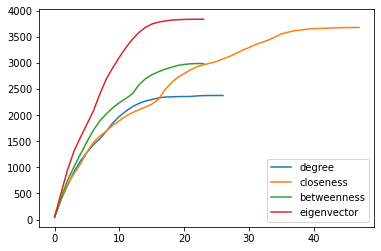

In [14]:
for centrality in centralitys:
    ic = diffusion_dict['LC'][centrality]
    plt.plot([len(x) for x in ic])
plt.legend(centralitys)

# Section 2 : Without community

### Compute centrality

In [30]:
full_dict = {"len" : len(g), "nodes" : list(g.nodes()), 
               "degree" : list(nx.degree_centrality(g).values()), 
               "closeness" : list(nx.closeness_centrality(g).values()), 
               "betweenness" : list(nx.betweenness_centrality(g).values()), 
               "eigenvector" : list(nx.eigenvector_centrality(g).values())}

### Select most central nodes in each centrality

In [31]:
# CENTRAL_DICT

full_central_dict = {}
factor = 0.007

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']
for centrality in centralitys:
    arr = np.array(full_dict[centrality])
    mask_central_node = mask_most_centrale_nodes(arr, factor=factor)
    central_nodes = np.array(full_dict["nodes"])[mask_central_node]
    full_central_dict[centrality] = central_nodes


In [32]:
for centrality in centralitys:
    print(centrality, len(full_central_dict[centrality]))

degree 36
closeness 32
betweenness 31
eigenvector 43


### Simulate diffusion

In [33]:
full_diffusion_dict = {}
full_diffusion_dict['LC'] = {}
full_diffusion_dict['IC'] = {}

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']
for centrality in centralitys:
    full_diffusion_dict['LC'][centrality] = LC_diffusion(g, full_central_dict[centrality])
    full_diffusion_dict['IC'][centrality] = IC_diffusion(g, full_central_dict[centrality], threshold=0.2)

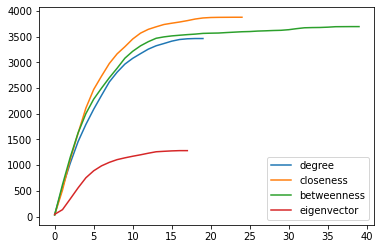

In [19]:
for centrality in centralitys:
    ic = full_diffusion_dict['LC'][centrality]
    plt.plot([len(x) for x in ic])
plt.legend(centralitys)

## Show by pair

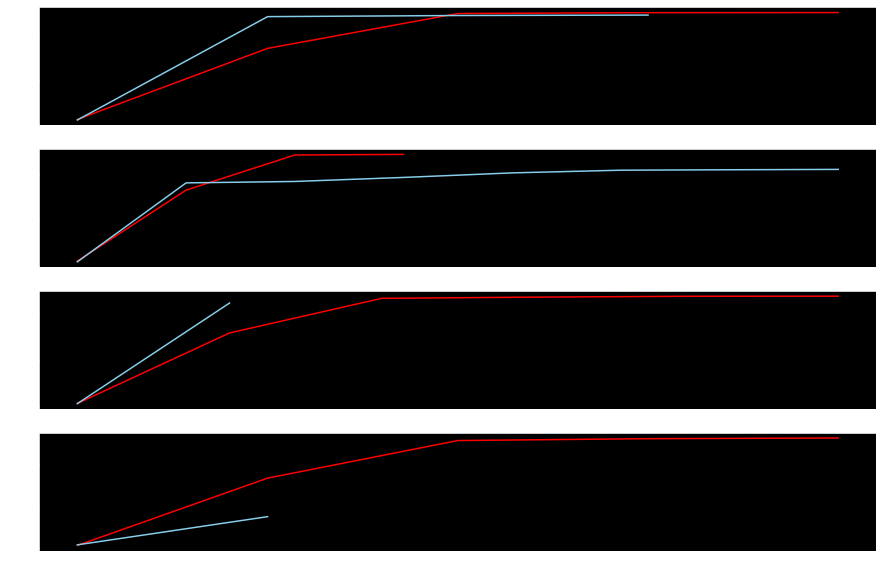

In [86]:
fig, axes = plt.subplots(4, figsize=(15, 10))

for i, centrality in enumerate(centralitys):
    ic = diffusion_dict['IC'][centrality]
    full_ic = full_diffusion_dict['IC'][centrality]
    axes[i].plot([len(x) for x in ic], label=centrality, color='red')
    axes[i].plot([len(x) for x in full_ic], label=centrality, color='skyblue')
    

# Section 3 : Mean & variance

## Simulate diffusion : with communities

In [154]:
n = 1000

LC_list = []
#IC_list = []

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']

for ep in range(n):
   LC_list_tmp = []
   #IC_list_tmp = []
   for i, centrality in enumerate(centralitys):
      lc = LC_diffusion(g, central_dict[centrality])
      #ic = IC_diffusion(g, central_dict[centrality], threshold=0.2)

      LC_list_tmp.append([len(x) for x in lc])
      #IC_list_tmp.append([len(x) for x in ic])
   
   LC_list.append(LC_list_tmp)
   #IC_list.append(IC_list_tmp)

LC_arr = inhomogeneous_list_to_array(LC_list)
#IC_arr = inhomogeneous_list_to_array(IC_list)
LC_arr.shape

ValueError: could not broadcast input array from shape (57,) into shape (43,)

In [16]:
n = 1000

full_LC_list = []
full_IC_list = []

centralitys = ['degree', 'closeness', 'betweenness', 'eigenvector']

for ep in range(n):
   full_LC_list_tmp = []
   #full_IC_list_tmp = []
   for i, centrality in enumerate(centralitys):
      lc = LC_diffusion(g, full_central_dict[centrality])
      #ic = IC_diffusion(g, full_central_dict[centrality], threshold=0.2)

      full_LC_list_tmp.append([len(x) for x in lc])
      #full_IC_list_tmp.append([len(x) for x in ic])
   
   full_LC_list.append(full_LC_list_tmp)
   #full_IC_list.append(IC_list_tmp)

full_LC_arr = inhomogeneous_list_to_array(full_LC_list)
#full_IC_arr = inhomogeneous_list_to_array(full_IC_list)
full_LC_arr.shape

(1000, 4, 71)

In [17]:
import pickle as pkl
# with open("LC_arr.pkl", "wb") as f:
#     pkl.dump(LC_arr, f)

with open("full_LC_arr.pkl", "wb") as f:
    pkl.dump(full_LC_arr, f)

In [18]:
#load LC_arr.pkl
with open("LC_arr.pkl", "rb") as f:
    LC_arr = pkl.load(f)

## Show

In [24]:
LC_arr.shape

(1000, 4, 69)

In [29]:
np.sum(np.invert(np.isnan(LC_arr)), axis=0).shape

(4, 69)

/tmp/ipykernel_8851/895279862.py:4: RuntimeWarning: Mean of empty slice
  mean_LC_arr = np.nanmean(LC_arr, axis=0)
/tmp/ipykernel_8851/895279862.py:5: RuntimeWarning: Mean of empty slice
  mean_full_LC_arr = np.nanmean(full_LC_arr, axis=0)
/tmp/ipykernel_8851/895279862.py:7: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var_LC_arr = np.nanvar(LC_arr, axis=0)  / np.sum(np.invert(np.isnan(LC_arr)), axis=0)
/tmp/ipykernel_8851/895279862.py:8: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var_full_LC_arr = np.nanvar(full_LC_arr, axis=0) / np.sum(np.invert(np.isnan(full_LC_arr)), axis=0)


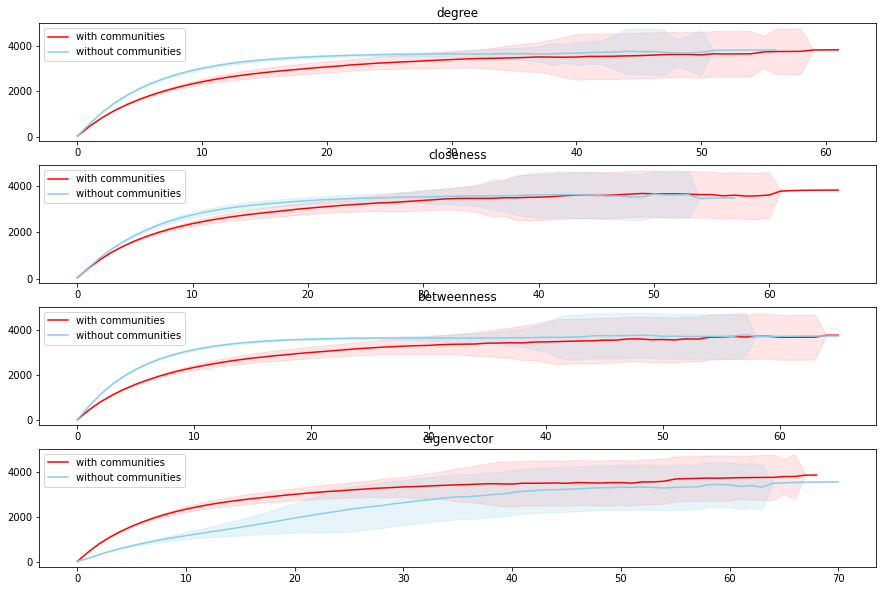

In [42]:
# Plot a figure with 4 subplots
fig, axes = plt.subplots(4, figsize=(15, 10))

mean_LC_arr = np.nanmean(LC_arr, axis=0)
mean_full_LC_arr = np.nanmean(full_LC_arr, axis=0)

var_LC_arr = np.nanvar(LC_arr, axis=0)  / np.sum(np.invert(np.isnan(LC_arr)), axis=0)
var_full_LC_arr = np.nanvar(full_LC_arr, axis=0) / np.sum(np.invert(np.isnan(full_LC_arr)), axis=0)

var_LC_arr[var_LC_arr > 1000] = 1000
var_full_LC_arr[var_full_LC_arr > 1000] = 1000

for i, centrality in enumerate(centralitys):
    #plot mean and variance of LC
    axes[i].plot(mean_LC_arr[i], color='red')
    axes[i].plot(mean_full_LC_arr[i], color='skyblue')
    axes[i].fill_between(np.arange(mean_LC_arr.shape[1]), mean_LC_arr[i] - var_LC_arr[i], mean_LC_arr[i] + var_LC_arr[i], color='red', alpha=0.1)
    axes[i].fill_between(np.arange(mean_full_LC_arr.shape[1]), mean_full_LC_arr[i] - var_full_LC_arr[i], mean_full_LC_arr[i] + var_full_LC_arr[i], color='skyblue', alpha=0.2)
    axes[i].set_title(centrality)
    axes[i].legend(['with communities', 'without communities'])


## Simulate diffusion : without communities

# Visualisation

## Community

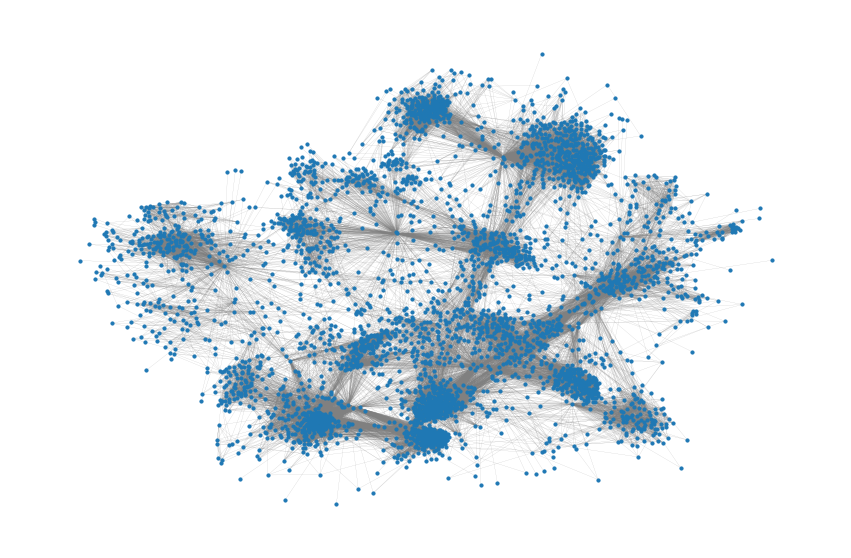

In [5]:
#load pos.pkl
with open("pos.pkl", "rb") as f:
    pos = pkl.load(f)
fig, ax = plt.subplots()

fig.set_size_inches(15, 10)

nx.draw(g, pos, edge_color=(0.5,0.5,0.5), node_size=10, width=0.1, with_labels=False)

In [36]:
color = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
colors = [
    (255, 0, 0),    # Rouge
    (0, 255, 0),    # Vert
    (0, 0, 255),    # Bleu
    (255, 255, 0),  # Jaune
    (255, 0, 255),  # Magenta
    (0, 255, 255),  # Cyan
    (128, 0, 0),    # Marron foncé
    (0, 128, 0),    # Vert foncé
    (0, 0, 128),    # Bleu foncé
    (128, 128, 0),  # Olive
    (128, 0, 128),  # Pourpre
    (0, 128, 128),  # Sarcelle
    (128, 128, 128),# Gris foncé
    (192, 192, 192),# Gris clair
    (0, 0, 0),      # Noir
    (255, 128, 0),  # Orange
    (128, 255, 0),  # Vert clair
    (0, 128, 255),  # Bleu clair
    (255, 0, 128),  # Rose
    (255, 128, 128),# Saumon
    (128, 255, 128),# Vert pâle
    (128, 128, 255),# Bleu pâle
    (255, 255, 128),# Beige
    (128, 255, 255),# Turquoise
]
random.shuffle(color)
i = 0

color_comm = np.full(len(g.nodes()), 'x')
for comm in l_comm:
    color_comm[indices_to_mask(list(comm), len(g.nodes()))] = color[i]
    i += 1
    if i == len(color):
        i = 0

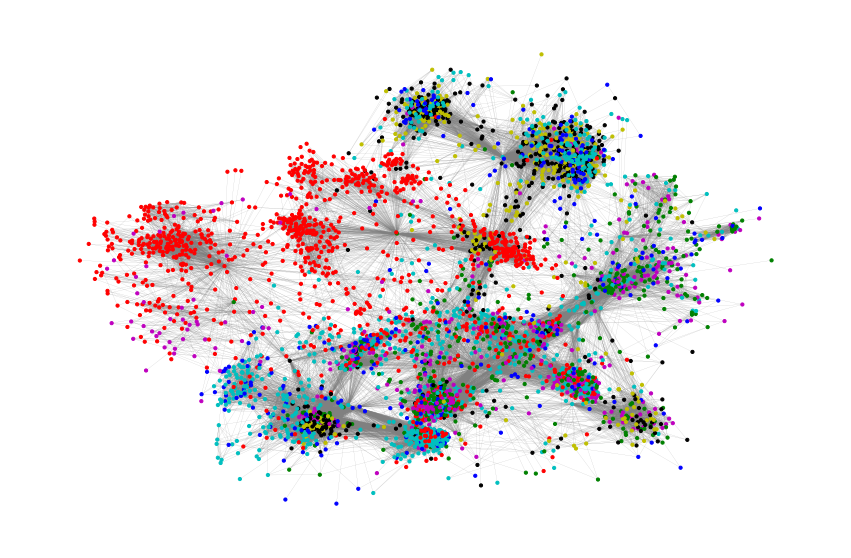

In [37]:
fig, ax = plt.subplots()

fig.set_size_inches(15, 10)
# Initialisez le graphe à la première étape de la diffusion

nx.draw(g, pos, node_color=color_comm, edge_color=(0.5,0.5,0.5), node_size=10, width=0.1, with_labels=False, ax=ax)

## Infection

### with communities

In [55]:
centralitys

['degree', 'closeness', 'betweenness', 'eigenvector']

In [345]:
pos = nx.spring_layout(g, k=0.1, iterations=50)

In [65]:
i = 0
filename = "visu/comm/LC/degree/comm_LC_degree_"

/tmp/ipykernel_8993/3818641875.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


end


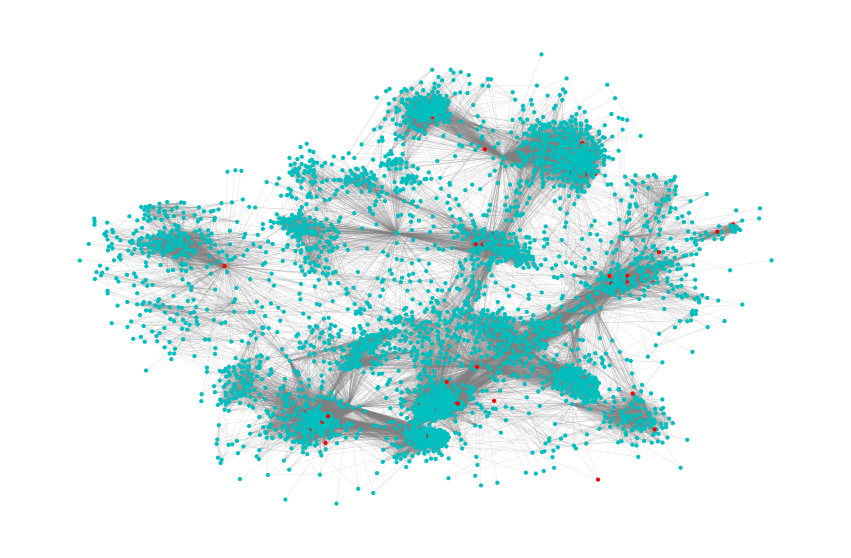

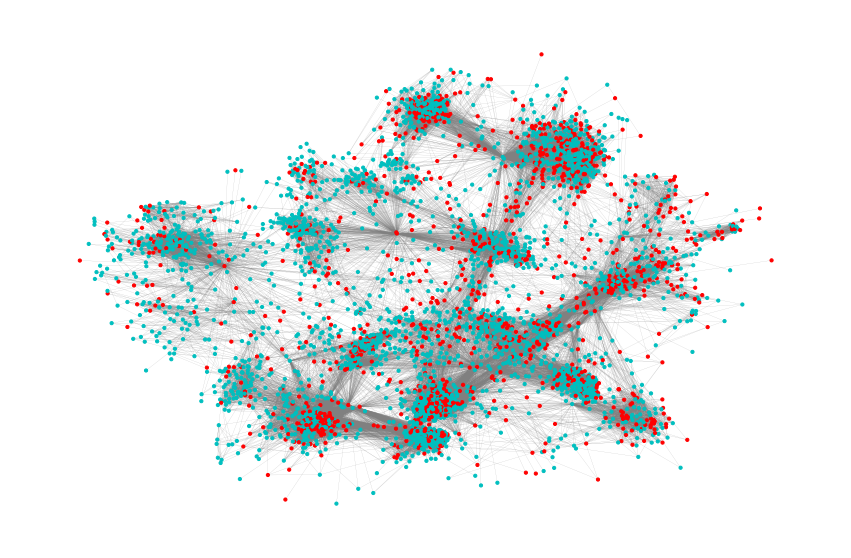

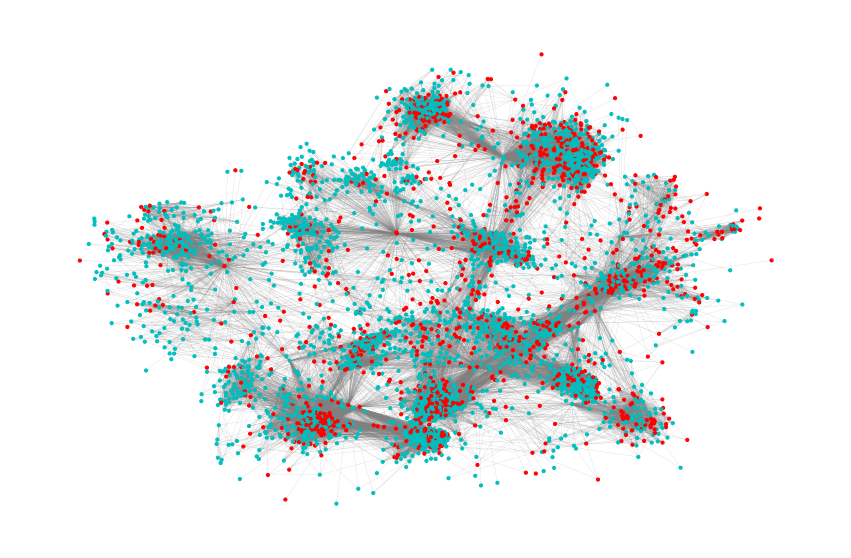

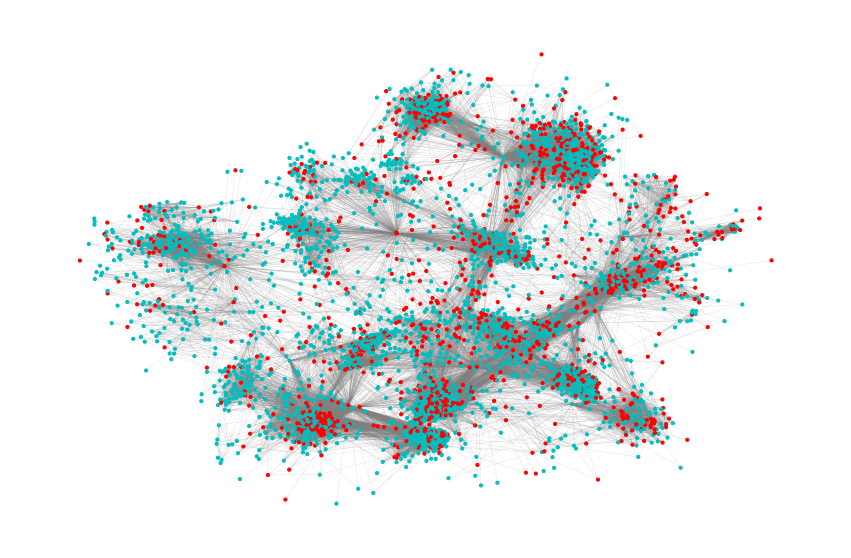

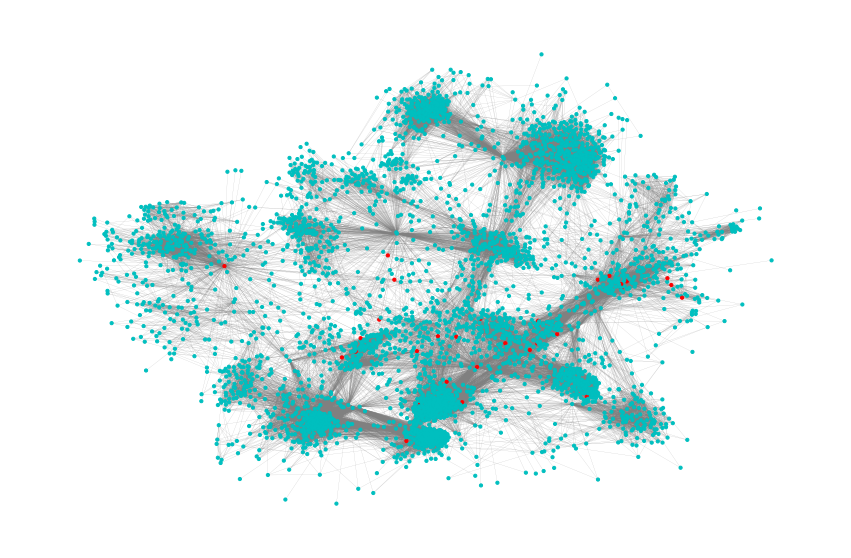

...

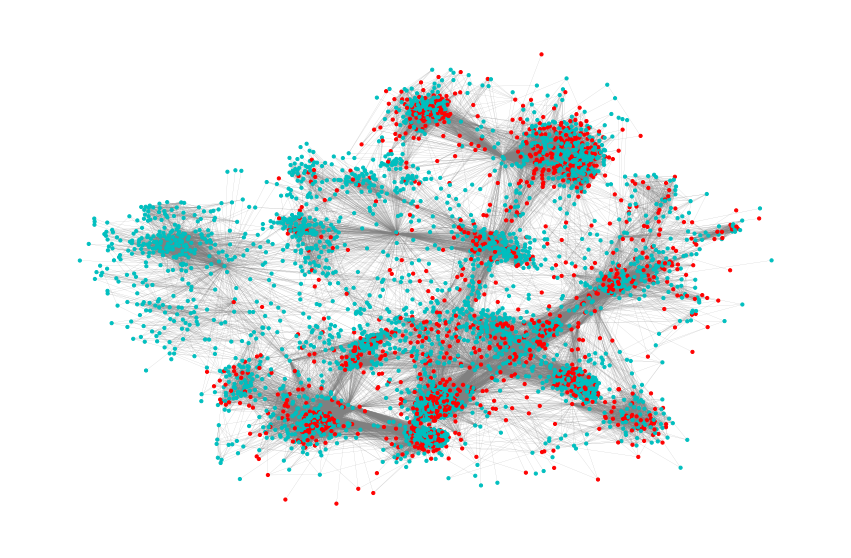

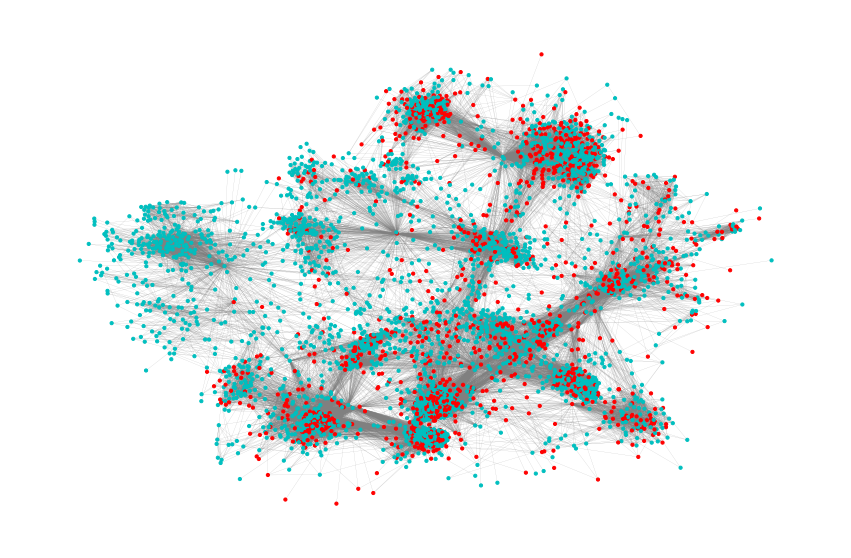

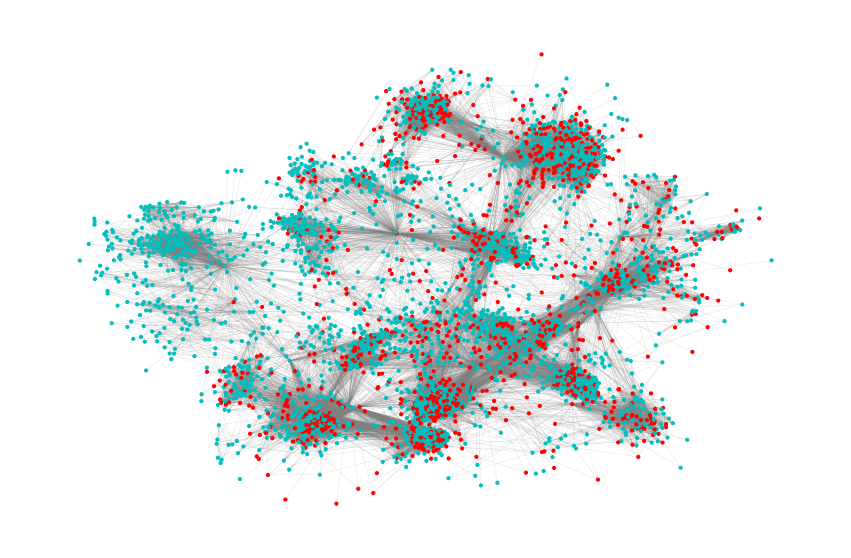

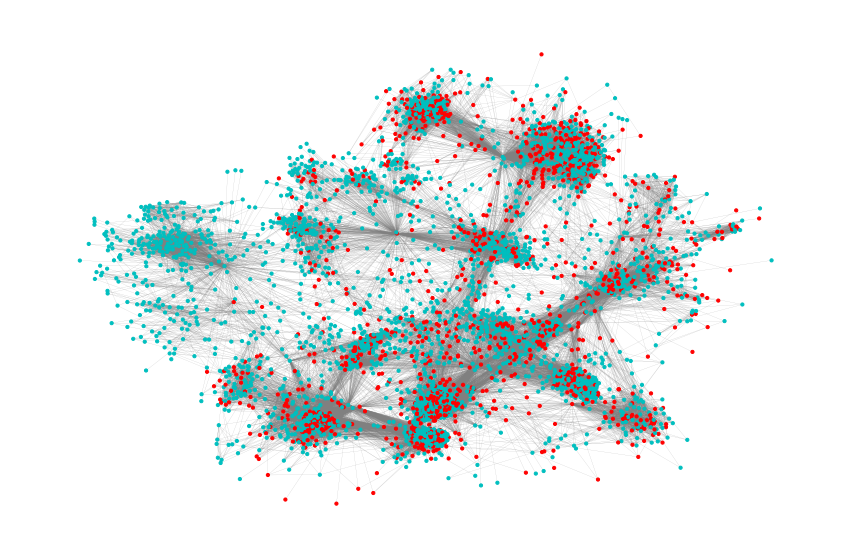

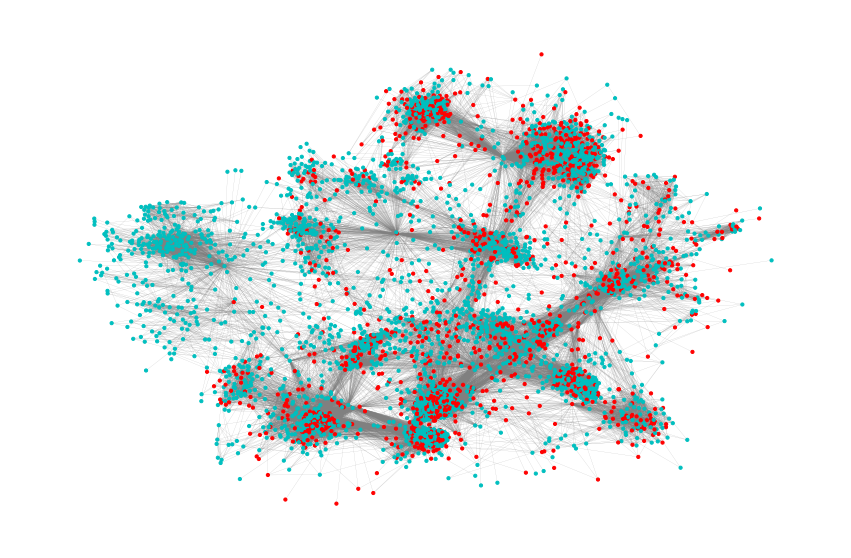

In [35]:
import os

for is_comm in [False]:
    for model in ['IC']:
        for centrality in centralitys:

            if is_comm:
                dictionnary = diffusion_dict[model][centrality]
                comm = 'comm_25'
            else:
                dictionnary = full_diffusion_dict[model][centrality]
                comm = 'full'

            for i in range(len(dictionnary)):

                filename = os.path.join("visu", comm, model, centrality, comm + model+"_"+centrality+"_"+ str(i) + ".png")

                fig, ax = plt.subplots()

                fig.set_size_inches(15, 10)
                # Initialisez le graphe à la première étape de la diffusion

                color_infected = indices_to_color(list(dictionnary[i]), len(g.nodes()))
                nx.draw(g, pos, node_color=color_infected, edge_color=(0.5,0.5,0.5), node_size=10, width=0.1, with_labels=False, ax=ax)

                plt.savefig(filename)

print("end")


### without communities

In [352]:
i = 0

4


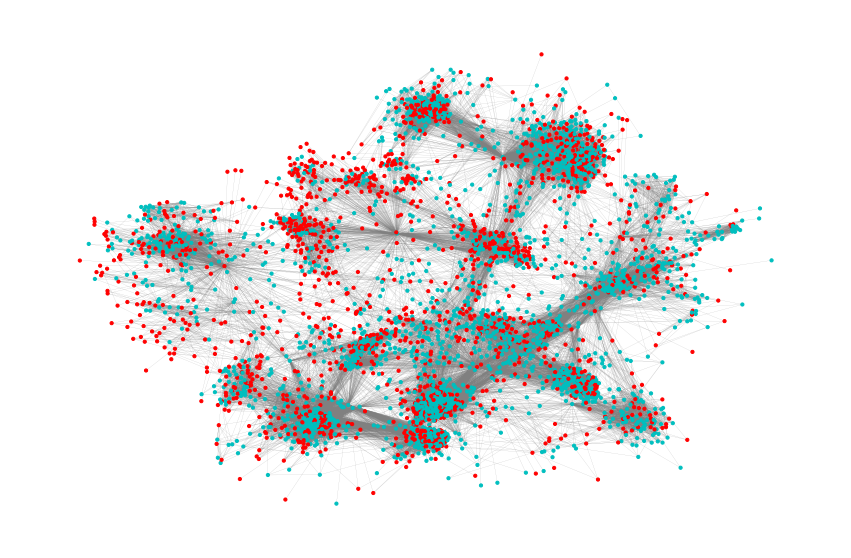

In [357]:
fig, ax = plt.subplots()

fig.set_size_inches(15, 10)
# Initialisez le graphe à la première étape de la diffusion

color_infected = indices_to_color(list(full_diffusion_dict['LC']['degree'][i]), len(g.nodes()))
nx.draw(g, pos, node_color=color_infected, edge_color=(0.5,0.5,0.5), node_size=10, width=0.1, with_labels=False, ax=ax)
print(i)
if i < len(diffusion_dict['LC']['degree']) - 1:
    i += 1